In [1]:
import numpy as np
import skbeam.core.utils as utils
import skbeam.core.roi as roi
import itertools

In [2]:
def lazy_one_time_using_time_stamps(image_iterable, time_stamps,
                               labels, num_bufs):
    """
    image_iterable :  iterable of 2D arrays
    time_stamps : list
        real time taken to collect each image as a list
    labels : array
        Labeled array of the same shape as the image stack.
        Each ROI is represented by sequential integers starting at one.  For
        example, if you have four ROIs, they must be labeled 1, 2, 3,
        4. Background is labeled as 0
     num_bufs : int
        maximum lag step to compute in each generation of downsampling

    """
    num_levels = 1   # todo higher levels
    label_array = []
    pixel_list = []

    label_array, pixel_list = extract_label_indices(labels)
    # map the indices onto a sequential list of integers starting at 1
    label_mapping = {label: n+1
                     for n, label in enumerate(np.unique(label_array))}
    # remap the label array to go from 1 -> max(_labels)
    for label, n in label_mapping.items():
        label_array[label_array == label] = n

    # number of ROI's
    num_rois = len(label_mapping)

    # stash the number of pixels in the mask
    num_pixels = np.bincount(label_array)[1:]

    # to increment buffer
    cur = np.ones(num_levels, dtype=np.int64)

    time_bin, all_times = time_binning(time_stamps)

    # G holds the un normalized auto- correlation result. We
    # accumulate computations into G as the algorithm proceeds.
    G = np.zeros((len(all_times), num_rois), dtype=np.float64)
    # matrix for normalizing G into g2

    past_intensity = np.zeros_like(G)
    # matrix for normalizing G into g2
    future_intensity = np.zeros_like(G)

    buf = np.zeros((num_levels, num_bufs, len(pixel_list)),
                   dtype=np.float64)

    time_track = np.zeros_like(all_times, dtype=np.int64)

    #if internal_state is None:
    #    internal_state = _init_state_one_time(num_levels, num_bufs, labels)
    # create a shorthand reference to the results and state named tuple
    #s = internal_state

    for image, timing in zip(image_iterable, time_bin):
        # Compute the correlations for all higher levels.
        level = 0

        # increment buffer
        cur[0] = (1 + cur[0]) % num_bufs
        print (timing)

        # Put the ROI pixels into the ring buffer.
        buf[0, cur[0] - 1] = np.ravel(image)[pixel_list]
        buf_no = cur[0] - 1

        #print("timing",timing)

        # Compute the correlations between the first level
        # (undownsampled) frames. This modifies G,
        # past_intensity, future_intensity,
        # and img_per_level in place!
        _one_time_process_time_stamps(buf, G, past_intensity,
                                      future_intensity,label_array,
                                      num_bufs, num_pixels,time_track,
                                      level, buf_no, timing, all_times)

        #TODO higher levels for multi tau

    print ("G", G)
    print ("past_intensity", past_intensity)
    print ("future_intensity", future_intensity)

    # If any past intensities are zero, then g2 cannot be normalized at
    # those levels. This if/else code block is basically preventing
    # divide-by-zero errors.
    if len(np.where(past_intensity == 0)[0]) != 0:
        g_max = np.where(past_intensity == 0)[0][0]
    else:
        g_max = past_intensity.shape[0]

    g2 = (G[:g_max]/ (past_intensity[:g_max] *
                             future_intensity[:g_max]))
    return g2, all_times


In [38]:
def _one_time_process_time_stamps(buf, G, past_intensity_norm,
                                  future_intensity_norm, label_array,
                                  num_bufs, num_pixels, time_track, level,
                                  buf_no, time_bin, all_time):
    """Reference implementation of the inner loop
     of lazy_one_time_using_time_stamps

    This helper function calculates G, past_intensity_norm and
    future_intensity_norm at each level, symmetric normalization is used.

    .. warning :: This modifies inputs in place.

    Parameters
    ----------
    buf : array
        image data array to use for correlation
    G : array
        matrix of auto-correlation function without normalizations
    past_intensity_norm : array
        matrix of past intensity normalizations
    future_intensity_norm : array
        matrix of future intensity normalizations
    label_array : array
        labeled array where all nonzero values are ROIs
    num_bufs : int, even
        number of buffers(channels)
    num_pixels : array
        number of pixels in certain ROI's
        ROI's, dimensions are : [number of ROI's]X1
    img_per_level : array
        to track how many images processed in each level
    level : int
        the current multi-tau level
    buf_no : int
        the current buffer number
    time_bin : list
        list of time binning

    Notes
    -----
    .. math::
        G = <I(\tau)I(\tau + delay)>
    .. math::
        past_intensity_norm = <I(\tau)>
    .. math::
        future_intensity_norm = <I(\tau + delay)>
    """
    #track_time[level] += 1
    #print ("track_time", track_time[level])
    # in multi-tau correlation, the subsequent levels have half as many
    # buffers as the first
    # i_min = num_bufs // 2 if level else 0
    #print ("time_bin",time_bin)
    for i, item in enumerate(time_bin):
        # compute the index into the autocorrelation matrix
        ii = np.where(all_time==item)[0]
     
        time_track[ii] += 1
        delay_no = (buf_no - i) % num_bufs
        
        print ("delay_no", delay_no)
        print ("buf_no", buf_no)

        # get the images for correlating
        past_img = buf[level, delay_no]
        future_img = buf[level, buf_no]
        
        # find the normalization that can work both for bad_images
        #  and good_images
        # ind = int(t_index - lev_len[:level].sum())
        # normalize = track_time[level] - i - norm[level+1][ind]

        # take out the past_ing and future_img created using bad images
        # (bad images are converted to np.nan array)
        #if np.isnan(past_img).any() or np.isnan(future_img).any():
        #    norm[level + 1][ind] += 1
        #else:
        for w, arr in zip([past_img*future_img, past_img, future_img],
                              [G, past_intensity_norm, future_intensity_norm]):
                binned = np.bincount(label_array, weights=w)[1:]
                arr[ii] += ((binned / num_pixels -
                                  arr[ii]) / time_track[ii])
    return None  # modifies arguments in place! 

In [39]:
def time_binning(time_stamps):
    time_bin = []
    all_time = [0]
    for c, t in enumerate(time_stamps):
        time = [0]
        stamp = 0
        for item in (time_stamps[:c][::-1]):
            stamp += item
            time.append(stamp)
            all_time.append(stamp)
        time_bin.append(time)
    return time_bin, np.unique(np.sort(all_time))

In [40]:
num_levels = 4
num_bufs = 4  # must be even
xdim = 200
ydim = 20
stack_size = 20
synthetic_data = np.random.randint(1, 100, (stack_size, xdim, ydim))

rois = np.zeros_like(synthetic_data[0])
# make sure that the ROIs can be any integers greater than 1. They do not
# have to start at 1 and be continuous
rois[0:xdim//10, 0:ydim//10] = 5
rois[xdim//10:xdim//5, ydim//10:ydim//5] = 3

# Using 10 random images

In [41]:
time = [10, 15, 20, 23, 25, 26, 27, 34, 30]
g2, all_time = lazy_one_time_using_time_stamps(synthetic_data, time, rois,
                                10, num_levels=1)

[0]
delay_no 1
buf_no 1
[0, 10]
delay_no 2
buf_no 2
delay_no 1
buf_no 2
[0, 15, 25]
delay_no 3
buf_no 3
delay_no 2
buf_no 3
delay_no 1
buf_no 3
[0, 20, 35, 45]
delay_no 4
buf_no 4
delay_no 3
buf_no 4
delay_no 2
buf_no 4
delay_no 1
buf_no 4
[0, 23, 43, 58, 68]
delay_no 5
buf_no 5
delay_no 4
buf_no 5
delay_no 3
buf_no 5
delay_no 2
buf_no 5
delay_no 1
buf_no 5
[0, 25, 48, 68, 83, 93]
delay_no 6
buf_no 6
delay_no 5
buf_no 6
delay_no 4
buf_no 6
delay_no 3
buf_no 6
delay_no 2
buf_no 6
delay_no 1
buf_no 6
[0, 26, 51, 74, 94, 109, 119]
delay_no 7
buf_no 7
delay_no 6
buf_no 7
delay_no 5
buf_no 7
delay_no 4
buf_no 7
delay_no 3
buf_no 7
delay_no 2
buf_no 7
delay_no 1
buf_no 7
[0, 27, 53, 78, 101, 121, 136, 146]
delay_no 8
buf_no 8
delay_no 7
buf_no 8
delay_no 6
buf_no 8
delay_no 5
buf_no 8
delay_no 4
buf_no 8
delay_no 3
buf_no 8
delay_no 2
buf_no 8
delay_no 1
buf_no 8
[0, 34, 61, 87, 112, 135, 155, 170, 180]
delay_no 9
buf_no -1
delay_no 8
buf_no -1
delay_no 7
buf_no -1
delay_no 6
buf_no -1
delay

In [12]:
g2

array([[ 1.25814654,  1.5104687 ],
       [ 0.97806732,  0.99994771],
       [ 0.98266502,  0.88535497],
       [ 0.93888152,  1.18378898],
       [ 0.89045036,  1.07628913],
       [ 0.98877748,  1.27553719],
       [ 1.07158548,  0.78456797],
       [ 0.96067012,  0.92569539],
       [ 0.84991948,  0.73502871],
       [ 1.11632423,  1.11647528],
       [ 1.00648394,  1.27038424],
       [ 0.93083671,  0.95220894],
       [ 1.14477248,  1.07561507],
       [ 1.12514702,  0.87729013],
       [ 0.54782609,  0.95273293],
       [ 0.96762159,  1.21411765],
       [ 0.99932042,  0.87359928],
       [ 1.0685019 ,  1.15794913],
       [ 1.25502823,  1.03257075],
       [ 1.10598291,  0.86123989],
       [ 1.05436528,  1.18884172],
       [ 1.1637976 ,  1.15598386],
       [ 0.83419817,  0.83024055],
       [ 0.95855742,  1.32982581],
       [ 0.9527592 ,  0.58227467],
       [ 1.07701043,  0.75900546],
       [ 1.05909043,  1.13465839],
       [ 1.03441172,  1.05585338],
       [ 0.98330835,

## Using the NIPA GEl data

In [13]:
data = np.load("/Volumes/Data/All_NSLS2/scikit-beam-examples/demos/time_correlation/100_500_NIPA_GEL.npy")

In [14]:
y = []
for i in range(10):
    y.append(data[0])

In [30]:
time = [10, 15, 20, 23, 25, 26, 27, 34, 30]

g2, all_time = lazy_one_time_using_time_stamps(y, time, rois,
                                10, num_levels=1)

[0]
delay_no 1
buf_no 1
past_img [ 1445.  1510.  1497.  1393.  1386.  1384.  1380.  1414.]
future_img [ 1445.  1510.  1497.  1393.  1386.  1384.  1380.  1414.]
arr [[ 1935062.    2137395.75]]
arr [[ 1391.    1461.25]]
arr [[ 1391.    1461.25]]
[0, 10]
delay_no 2
buf_no 2
past_img [ 1445.  1510.  1497.  1393.  1386.  1384.  1380.  1414.]
future_img [ 1445.  1510.  1497.  1393.  1386.  1384.  1380.  1414.]
arr [[ 1935062.    2137395.75]]
arr [[ 1391.    1461.25]]
arr [[ 1391.    1461.25]]
delay_no 1
buf_no 2
past_img [ 1445.  1510.  1497.  1393.  1386.  1384.  1380.  1414.]
future_img [ 1445.  1510.  1497.  1393.  1386.  1384.  1380.  1414.]
arr [[ 1935062.    2137395.75]]
arr [[ 1391.    1461.25]]
arr [[ 1391.    1461.25]]
[0, 15, 25]
delay_no 3
buf_no 3
past_img [ 1445.  1510.  1497.  1393.  1386.  1384.  1380.  1414.]
future_img [ 1445.  1510.  1497.  1393.  1386.  1384.  1380.  1414.]
arr [[ 1935062.    2137395.75]]
arr [[ 1391.    1461.25]]
arr [[ 1391.    1461.25]]
delay_no 2
buf_n

In [31]:
g2

array([[ 1.00009355,  1.00100418],
       [ 1.00009355,  1.00100418],
       [ 1.00009355,  1.00100418],
       [ 1.00009355,  1.00100418],
       [ 1.00009355,  1.00100418],
       [ 1.00009355,  1.00100418],
       [ 1.00009355,  1.00100418],
       [ 1.00009355,  1.00100418],
       [ 1.00009355,  1.00100418],
       [ 1.00009355,  1.00100418],
       [ 1.00009355,  1.00100418],
       [ 1.00009355,  1.00100418],
       [ 1.00009355,  1.00100418],
       [ 1.00009355,  1.00100418],
       [ 1.00009355,  1.00100418],
       [ 1.00009355,  1.00100418],
       [ 1.00009355,  1.00100418],
       [ 1.00009355,  1.00100418],
       [ 1.00009355,  1.00100418],
       [ 1.00009355,  1.00100418],
       [ 1.00009355,  1.00100418],
       [ 1.00009355,  1.00100418],
       [ 1.00009355,  1.00100418],
       [ 1.00009355,  1.00100418],
       [ 1.00009355,  1.00100418],
       [ 1.00009355,  1.00100418],
       [ 1.00009355,  1.00100418],
       [ 1.00009355,  1.00100418],
       [ 1.00009355,

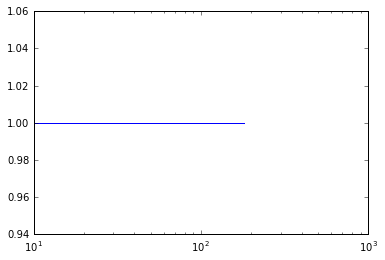

In [32]:
fig, ax = plt.subplots()
ax.semilogx(all_time, g2[:, 0])
plt.show()

## Using 20 random data sets

In [19]:
time = np.random.choice(np.arange(18, 28), 20)
time

array([22, 22, 21, 25, 25, 19, 27, 26, 24, 18, 26, 26, 23, 20, 23, 18, 19,
       23, 27, 18])

In [20]:
xdim = 20
ydim = 20
stack_size = 20
synthetic_data = np.random.randint(1, 100, (stack_size, xdim, ydim))

rois = np.zeros_like(synthetic_data[0])
# make sure that the ROIs can be any integers greater than 1. They do not
# have to start at 1 and be continuous
rois[0:xdim//10, 0:ydim//10] = 5
rois[xdim//10:xdim//5, ydim//10:ydim//5] = 3

[0]
delay_no 1
buf_no 1
past_img [ 97.  39.  19.  70.  75.  95.  77.  38.]
future_img [ 97.  39.  19.  70.  75.  95.  77.  38.]
arr [[ 5505.75  4047.75]]
arr [[ 71.25  56.25]]
arr [[ 71.25  56.25]]
[0, 22]
delay_no 2
buf_no 2
past_img [ 40.  79.  19.  32.  74.  85.  55.  93.]
future_img [ 40.  79.  19.  32.  74.  85.  55.  93.]
arr [[ 5799.75   3177.125]]
arr [[ 74.     49.375]]
arr [[ 74.     49.375]]
delay_no 1
buf_no 2
past_img [ 97.  39.  19.  70.  75.  95.  77.  38.]
future_img [ 40.  79.  19.  32.  74.  85.  55.  93.]
arr [[ 5348.5  2390.5]]
arr [[ 71.25  56.25]]
arr [[ 76.75  42.5 ]]
[0, 22, 44]
delay_no 3
buf_no 3
past_img [ 94.   8.  24.  19.  94.  76.  98.  80.]
future_img [ 94.   8.  24.  19.  94.  76.  98.  80.]
arr [[ 6417.83333333  2937.83333333]]
arr [[ 78.33333333  45.        ]]
arr [[ 78.33333333  45.        ]]
delay_no 2
buf_no 3
past_img [ 40.  79.  19.  32.  74.  85.  55.  93.]
future_img [ 94.   8.  24.  19.  94.  76.  98.  80.]
arr [[ 5955.    1877.25]]
arr [[ 74.

In [34]:
g2_new, all_time = lazy_one_time_using_time_stamps(synthetic_data, time, rois,
                                20, num_levels=1)

[0]
delay_no 1
buf_no 1
past_img [ 54.  15.  71.  90.   3.  61.  82.  11.  35.  12.  51.  99.  30.  26.  78.
  30.  12.  89.  76.  19.  20.  70.  21.  76.  54.  91.  98.  98.  17.   2.
  87.  37.  79.  88.  66.  68.  79.  75.  15.  22.  71.   6.  92.  15.  28.
  46.  76.  15.  80.  22.  70.  23.  64.  40.  57.  44.  12.  43.  86.  77.
  77.  49.  71.  47.  94.  55.  82.  56.  63.  43.  98.  20.  74.  56.  65.
  84.  70.  81.  74.  29.  62.  49.  30.  82.   2.   6.  22.  15.  61.   6.
   3.  42.  18.   4.  51.  20.  56.   5.  41.  28.  48.  59.  69.  20.  64.
  16.  90.  71.  85.  70.  77.  63.  18.  27.  88.  41.  87.  89.  30.  42.
  23.  47.   1.  18.  48.  90.  24.  98.   8.  76.  10.  96.  88.  12.  47.
  13.  49.  45.  68.  24.  85.  55.  68.  22.   7.  60.  57.   1.   9.  99.
  48.  71.   3.  32.  19.   3.  18.  12.  95.  55.  98.  51.  86.  24.  57.
  26.  22.  13.  26.  13.  45.  63.  88.  85.  49.  22.  36.  45.  53.  73.
  80.  74.  54.  41.  44.   2.   1.  25.  15.  16.  18.

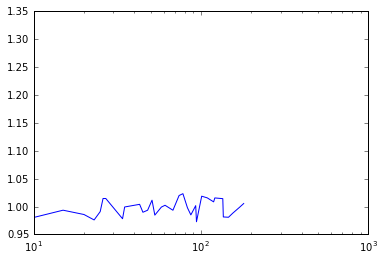

In [35]:
import matplotlib.pyplot as plt
%matplotlib inline
fig, ax = plt.subplots()
ax.semilogx(all_time, g2_new[:, 0])
plt.show()

In [28]:
g2_new[:,0], all_time

(array([ 1.31606158,  0.82665329,  0.9413818 ,  0.81403186,  0.93888152,
         0.98287601,  0.95697979,  0.84626251,  0.83811495,  0.95373265,
         0.82280824,  1.08263279,  0.64681604,  1.22650896,  1.14472468,
         1.05712435,  0.87836031,  1.22815534,  1.13551666,  1.05701924,
         0.99932042,  0.8887991 ,  1.01812801,  0.93083671,  1.23106959,
         0.98012165,  1.10732961,  0.97475066,  1.01078964,  1.1637976 ,
         0.9372549 ,  0.96225296,  1.054569  ,  0.66920045,  0.6494818 ,
         1.28324121,  1.04838597,  1.17754494,  0.93609758,  0.92781647,
         0.86668617,  0.93305933,  1.05909043,  1.0131628 ,  1.04267302,
         1.07701043,  1.13137438,  1.04678266,  0.83419817,  1.01841511,
         0.89481654,  0.71663605,  1.030419  ,  0.90527066,  0.76648479,
         1.09458387,  0.94141706,  1.03441172,  0.96992481,  0.97935957,
         1.01627761,  1.27157117,  0.99400609,  1.12973594,  0.86764009,
         0.76454124,  1.36132953,  1.18088801,  0.9

## Using 200 random data sets

In [33]:
xdim = 200
ydim = 200
stack_size = 200
synthetic_data = np.random.randint(1, 100, (stack_size, xdim, ydim))

rois = np.zeros_like(synthetic_data[0])
# make sure that the ROIs can be any integers greater than 1. They do not
# have to start at 1 and be continuous
rois[0:xdim//10, 0:ydim//10] = 5
rois[xdim//10:xdim//5, ydim//10:ydim//5] = 3

In [ ]:
time = np.random.choice(np.arange(18, 28), 200)

g2_n, all_time_n = lazy_one_time_using_time_stamps(synthetic_data, time, rois,
                                200, num_levels=1)

[0]
delay_no 1
buf_no 1
past_img [ 54.  15.  71.  90.   3.  61.  82.  11.  35.  12.  51.  99.  30.  26.  78.
  30.  12.  89.  76.  19.  20.  70.  21.  76.  54.  91.  98.  98.  17.   2.
  87.  37.  79.  88.  66.  68.  79.  75.  15.  22.  71.   6.  92.  15.  28.
  46.  76.  15.  80.  22.  70.  23.  64.  40.  57.  44.  12.  43.  86.  77.
  77.  49.  71.  47.  94.  55.  82.  56.  63.  43.  98.  20.  74.  56.  65.
  84.  70.  81.  74.  29.  62.  49.  30.  82.   2.   6.  22.  15.  61.   6.
   3.  42.  18.   4.  51.  20.  56.   5.  41.  28.  48.  59.  69.  20.  64.
  16.  90.  71.  85.  70.  77.  63.  18.  27.  88.  41.  87.  89.  30.  42.
  23.  47.   1.  18.  48.  90.  24.  98.   8.  76.  10.  96.  88.  12.  47.
  13.  49.  45.  68.  24.  85.  55.  68.  22.   7.  60.  57.   1.   9.  99.
  48.  71.   3.  32.  19.   3.  18.  12.  95.  55.  98.  51.  86.  24.  57.
  26.  22.  13.  26.  13.  45.  63.  88.  85.  49.  22.  36.  45.  53.  73.
  80.  74.  54.  41.  44.   2.   1.  25.  15.  16.  18.

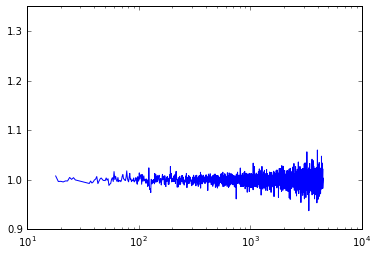

In [37]:
fig, ax = plt.subplots()
ax.semilogx(all_time_n, g2_n[:, 0])
plt.show()